In [1]:
import numpy as np
import matplotlib.pyplot as plt 
import random
import math
import time
from mpl_toolkits.mplot3d import Axes3D
import os

In [3]:
def randompoint(LD):
    x,y = 1,1
    while (x**2+y**2 >= 1):
        x = random.random()
        y = random.random()
    return(np.arctan(x/LD),np.arctan(y/LD))

In [4]:
def readplot3d(Foldername,run):
    
    title1 = Foldername + "Hist-Geometry3D-"+str(run)+".txt"
    title2 = Foldername + "Xax-Geometry3D-"+str(run)+".txt"
    title3 = Foldername + "Yax-Geometry3D-"+str(run)+".txt"
    
    with open(title1, 'r') as file:
        hist = np.array(eval(file.read())) # read list string and convert to array
    with open(title2, 'r') as file:
        xax = np.array(eval(file.read())) # read list string and convert to array
    with open(title3, 'r') as file:
        yax = np.array(eval(file.read())) # read list string and convert to array
    return hist, xax, yax
    

Text(0.5, 0, 'LD')

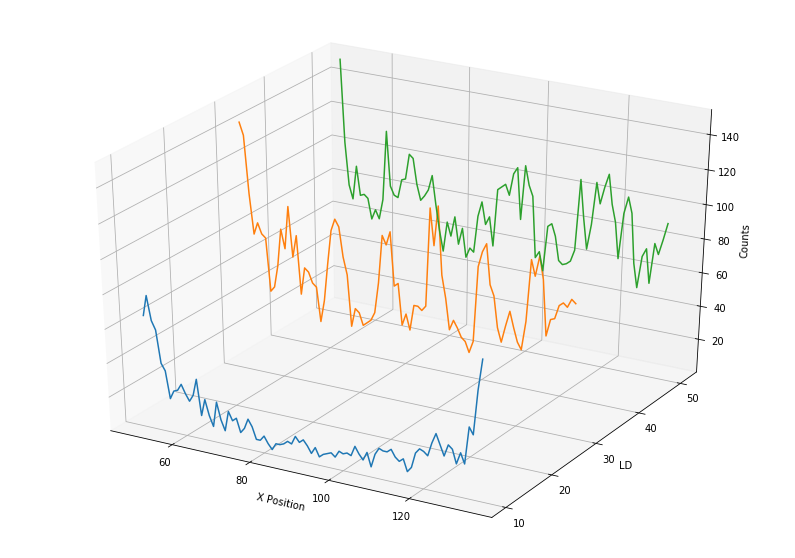

In [34]:
plt.figure(figsize=(14,10))
ax = plt.subplot(projection='3d')
number = [10,30,51]
axis = np.linspace(50,134,85)
for i in number:
    Foldername = "Data-variable-LD/"
    hist,xax,yax = readplot3d(Foldername,i)
    hist_resh = np.reshape(np.array(hist.tolist()).astype(np.float),[200,200])
    ax.plot(axis,np.ones(axis.size)*i,hist_resh[100][50:135])
ax.set_xlabel('X Position')
ax.set_zlabel('Counts')
ax.set_ylabel('LD')
#plt.plot(hist_resh[100])
#plt.figure(figsize=(40,11))
#plt.show()

Text(0.5, 0, 'Resistance (%)')

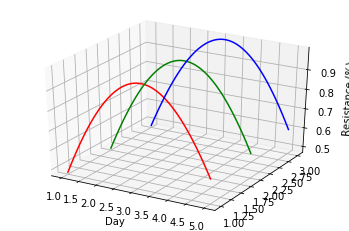

In [11]:
x   = np.linspace(1,5,100)
y1  = np.ones(x.size)
y2  = np.ones(x.size)*2
y3  = np.ones(x.size)*3
z   = np.sin(x/2)

plt.figure()
ax = plt.subplot(projection='3d')
ax.plot(x, y1, z, color='r')
ax.plot(x, y2, z, color='g')
ax.plot(x, y3, z, color='b')

#ax.add_collection3d(plt.fill_between(x, 0.95*z, 1.05*z, color='r', alpha=0.3), zs=1, zdir='y')
#ax.add_collection3d(plt.fill_between(x, 0.90*z, 1.10*z, color='g', alpha=0.3), zs=2, zdir='y')
#ax.add_collection3d(plt.fill_between(x, 0.85*z, 1.15*z, color='b', alpha=0.3), zs=3, zdir='y')

ax.set_xlabel('Day')
ax.set_zlabel('Resistance (%)')

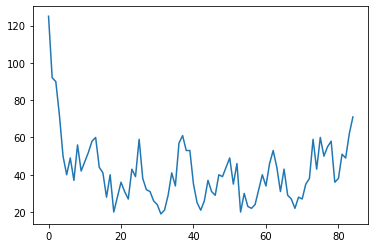

<Figure size 2880x792 with 0 Axes>

In [22]:
plt.figure()
#ax = plt.subplot(projection='3d')
number = [10,20,30,40,50]
axis = np.linspace(50,135,85)
Foldername = "Data-variable-LD/"
hist,xax,yax = readplot3d(Foldername,20)
hist_resh = np.reshape(np.array(hist.tolist()).astype(np.float),[200,200])
#ax.plot(axis,i,hist_resh[100][50:135])
plt.plot(hist_resh[100][50:135])
plt.figure(figsize=(40,11))
plt.show()

In [2]:
def readplot3dFULL(title,fileindex,foldernumber):
    
    label = ["/Testrun-of-full-sim-positionXY-index","/Testrun-of-full-sim-AngleX-index","/Testrun-of-full-sim-AngleY-index","positionXY_white","AngleX_white","AngleY_white"]
    
    title1 = "Hist-Geometry3D-batch-"+str(foldernumber)+"-item-"+str(fileindex)+".txt"
    title2 = "Xax-Geometry3D-batch-"+str(foldernumber)+"-item-"+str(fileindex)+".txt"
    title3 = "Yax-Geometry3D-batch-"+str(foldernumber)+"-item-"+str(fileindex)+".txt"
    title4 = "Test"+ str(foldernumber) +label[0] + str(fileindex) + ".txt"
    title5 = "Test"+ str(foldernumber) +label[1] + str(fileindex) + ".txt"
    title6 = "Test"+ str(foldernumber) +label[2] + str(fileindex) + ".txt"
    
    with open(title1, 'r') as file:
        hist = np.array(eval(file.read())) # read list string and convert to array
        file.close()
    with open(title2, 'r') as file:
        xax = np.array(eval(file.read())) # read list string and convert to array
        file.close()
    with open(title3, 'r') as file:
        yax = np.array(eval(file.read())) # read list string and convert to array
        file.close()
    with open(title4, 'r') as file:
        position = np.array(eval(file.read())) # read list string and convert to array
        file.close()
    with open(title5, 'r') as file:
        AngleX = np.array(eval(file.read())) # read list string and convert to array
        file.close()
    with open(title6, 'r') as file:
        AngleY = np.array(eval(file.read())) # read list string and convert to array
        file.close()
    return hist, xax, yax, position,AngleX,AngleY

def plot3D(x,y,dist_to_det,condition_white,condition_ax):
    plt.figure(figsize=(14,12))
    
    plt.hist2d(x,y,bins=200,range=[[10,30],[10,30]])
    plt.xlabel("X coordinate (mm)")
    plt.ylabel("Y coordinate (mm)")
    plt.colorbar()
    title = "Neutron count with LD "+str(dist_to_det)
    #plt.savefig(title)
    '''
    if condition_white == True:
        title1 = "Hist-Geometry3D-"+str(run)+".txt"
        title2 = "Xax-Geometry3D-"+str(run)+".txt"
        title3 = "Yax-Geometry3D-"+str(run)+".txt"
    elif condition_white == False: 
        title1 = "Hist_white-Geometry3D-"+str(run)+".txt"
        title2 = "Xax_white-Geometry3D-"+str(run)+".txt"
        title3 = "Yax_white-Geometry3D-"+str(run)+".txt"
    '''
    #f1 = open(title1,"a")
    #f2 = open(title2,"a")
    #f3 = open(title3,"a")
    
    hist,xax,yax,image = plt.hist2d(x,y,bins=200,range=[[10,30],[10,30]])
    print("Hist dimensions pre: ",len(hist))
    '''
    for item in (hist):
        for elem in item:
            f1.write(str(elem))
            f1.write(",")
    f1.close()
    for item in (xax):
        f2.write(str(item))
        f2.write(",")
    f2.close()
    for item in (yax):
        f3.write(str(item))
        f3.write(",")
    f3.close()
    '''
    print("file(s) saved")
    if condition_ax == True:
        return hist,xax,yax
    else:
        return hist

New file
Hist dimensions pre:  200
file(s) saved
I'm here
First files created on index 0, Folder 1
Readfull successful, common indices ready
{2572616, 4796801, 3978385}
Distribution X:  [0.00173707 0.00178673 0.00127898]
Histogram 0 added
Current histogram:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 3. 0. 0. 0. 0. 0. 0. 0. 0.]
Current binning:  [-0.01  -0.009 -0.008 -0.007 -0.006 -0.005 -0.004 -0.003 -0.002 -0.001
  0.     0.001  0.002  0.003  0.004  0.005  0.006  0.007  0.008  0.009
  0.01 ]
Number of elements:  3.0


New file
Hist dimensions pre:  200
file(s) saved
I'm here
First files created on index 1, Folder 1
Readfull successful, common indices ready
{3657155, 4354382}
Distribution X:  [ 0.00360613 -0.00307095]
Histogram 1 added
Current histogram:  [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 3. 0. 1. 0. 0. 0. 0. 0. 0.]
Current binning:  [-0.01  -0.009 -0.008 -0.007 -0.006 -0.005 -0.004 -0.003 -0.002 -0.001
  0.     0.001  0.002  0.003  0.004  0.005  0.006  0.007  0.008  0.009
  0.01 ]
Number of e

Hist dimensions pre:  200
file(s) saved
I'm here
First files created on index 2, Folder 2
Readfull successful, common indices ready
{4475331, 985956, 4202825, 4549015, 4404700}
Distribution X:  [-3.20826046e-03 -2.88230703e-03 -3.93568740e-05  5.54447743e-03
  2.44483151e-03]
Histogram 2 added
Current histogram:  [0. 0. 0. 0. 0. 0. 5. 1. 1. 1. 3. 6. 6. 2. 3. 6. 1. 0. 0. 0.]
Current binning:  [-0.01  -0.009 -0.008 -0.007 -0.006 -0.005 -0.004 -0.003 -0.002 -0.001
  0.     0.001  0.002  0.003  0.004  0.005  0.006  0.007  0.008  0.009
  0.01 ]
Number of elements:  35.0


New file
Hist dimensions pre:  200
file(s) saved
I'm here
First files created on index 3, Folder 2
Readfull successful, common indices ready
{1323672, 2587850, 1775914, 1794455}
Distribution X:  [ 0.00447206 -0.00243396  0.00509167  0.00432582]
Histogram 3 added
Current histogram:  [0. 0. 0. 0. 0. 0. 5. 2. 1. 1. 3. 6. 6. 2. 5. 7. 1. 0. 0. 0.]
Current binning:  [-0.01  -0.009 -0.008 -0.007 -0.006 -0.005 -0.004 -0.003 -0.002

/usr/local/bin/start_ipykernel.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Hist dimensions pre:  200
file(s) saved
I'm here
First files created on index 6, Folder 2
Readfull successful, common indices ready
[]
Distribution X:  []
Histogram 6 added
Current histogram:  [0. 0. 0. 0. 0. 0. 6. 2. 1. 1. 4. 6. 6. 4. 5. 7. 1. 0. 0. 0.]
Current binning:  [-0.01  -0.009 -0.008 -0.007 -0.006 -0.005 -0.004 -0.003 -0.002 -0.001
  0.     0.001  0.002  0.003  0.004  0.005  0.006  0.007  0.008  0.009
  0.01 ]
Number of elements:  43.0


New file
Hist dimensions pre:  200
file(s) saved
I'm here
First files created on index 7, Folder 2
Readfull successful, common indices ready
[]
Distribution X:  []
Histogram 7 added
Current histogram:  [0. 0. 0. 0. 0. 0. 6. 2. 1. 1. 4. 6. 6. 4. 5. 7. 1. 0. 0. 0.]
Current binning:  [-0.01  -0.009 -0.008 -0.007 -0.006 -0.005 -0.004 -0.003 -0.002 -0.001
  0.     0.001  0.002  0.003  0.004  0.005  0.006  0.007  0.008  0.009
  0.01 ]
Number of elements:  43.0


New file
Hist dimensions pre:  200
file(s) saved
I'm here
First files created on index 

Readfull successful, common indices ready
{4192436}
Distribution X:  [-0.00159642]
Histogram 8 added
Current histogram:  [0. 0. 0. 0. 0. 0. 8. 7. 3. 1. 5. 6. 9. 6. 7. 7. 1. 0. 0. 0.]
Current binning:  [-0.01  -0.009 -0.008 -0.007 -0.006 -0.005 -0.004 -0.003 -0.002 -0.001
  0.     0.001  0.002  0.003  0.004  0.005  0.006  0.007  0.008  0.009
  0.01 ]
Number of elements:  60.0


New file
Hist dimensions pre:  200
file(s) saved
I'm here
First files created on index 9, Folder 3
Readfull successful, common indices ready
{702155}
Distribution X:  [0.00064548]
Histogram 9 added
Current histogram:  [0. 0. 0. 0. 0. 0. 8. 7. 3. 1. 6. 6. 9. 6. 7. 7. 1. 0. 0. 0.]
Current binning:  [-0.01  -0.009 -0.008 -0.007 -0.006 -0.005 -0.004 -0.003 -0.002 -0.001
  0.     0.001  0.002  0.003  0.004  0.005  0.006  0.007  0.008  0.009
  0.01 ]
Number of elements:  61.0


New file
Hist dimensions pre:  200
file(s) saved
I'm here
First files created on index 10, Folder 3
Readfull successful, common indices ready
{

Hist dimensions pre:  200
file(s) saved
I'm here
First files created on index 10, Folder 4
Readfull successful, common indices ready
[]
Distribution X:  []
Histogram 10 added
Current histogram:  [ 0.  0.  0.  0.  0.  0. 10.  8.  6.  4.  6.  6. 13.  9.  8.  9.  2.  0.
  0.  0.]
Current binning:  [-0.01  -0.009 -0.008 -0.007 -0.006 -0.005 -0.004 -0.003 -0.002 -0.001
  0.     0.001  0.002  0.003  0.004  0.005  0.006  0.007  0.008  0.009
  0.01 ]
Number of elements:  81.0


New file
Hist dimensions pre:  200
file(s) saved
I'm here
First files created on index 11, Folder 4
Readfull successful, common indices ready
{1312624}
Distribution X:  [0.00265123]
Histogram 11 added
Current histogram:  [ 0.  0.  0.  0.  0.  0. 10.  8.  6.  4.  6.  6. 14.  9.  8.  9.  2.  0.
  0.  0.]
Current binning:  [-0.01  -0.009 -0.008 -0.007 -0.006 -0.005 -0.004 -0.003 -0.002 -0.001
  0.     0.001  0.002  0.003  0.004  0.005  0.006  0.007  0.008  0.009
  0.01 ]
Number of elements:  82.0


New file
Hist dimensions

Hist dimensions pre:  200
file(s) saved
I'm here
First files created on index 11, Folder 5
Readfull successful, common indices ready
{2364427, 1032734}
Distribution X:  [-0.00051677  0.00423334]
Histogram 11 added
Current histogram:  [ 0.  0.  0.  0.  0.  0. 12. 10.  9.  8.  9. 10. 17.  9. 14. 11.  4.  0.
  0.  0.]
Current binning:  [-0.01  -0.009 -0.008 -0.007 -0.006 -0.005 -0.004 -0.003 -0.002 -0.001
  0.     0.001  0.002  0.003  0.004  0.005  0.006  0.007  0.008  0.009
  0.01 ]
Number of elements:  113.0


New file
Hist dimensions pre:  200
file(s) saved
I'm here
First files created on index 12, Folder 5
Readfull successful, common indices ready
[]
Distribution X:  []
Histogram 12 added
Current histogram:  [ 0.  0.  0.  0.  0.  0. 12. 10.  9.  8.  9. 10. 17.  9. 14. 11.  4.  0.
  0.  0.]
Current binning:  [-0.01  -0.009 -0.008 -0.007 -0.006 -0.005 -0.004 -0.003 -0.002 -0.001
  0.     0.001  0.002  0.003  0.004  0.005  0.006  0.007  0.008  0.009
  0.01 ]
Number of elements:  113.0




Hist dimensions pre:  200
file(s) saved
I'm here
First files created on index 12, Folder 6
Readfull successful, common indices ready
{3663636, 3901726, 2776519}
Distribution X:  [-0.00342957 -0.0007586   0.00407505]
Histogram 12 added
Current histogram:  [ 0.  0.  0.  0.  0.  0. 17. 14. 12. 10. 13. 11. 18. 12. 18. 12.  5.  0.
  0.  0.]
Current binning:  [-0.01  -0.009 -0.008 -0.007 -0.006 -0.005 -0.004 -0.003 -0.002 -0.001
  0.     0.001  0.002  0.003  0.004  0.005  0.006  0.007  0.008  0.009
  0.01 ]
Number of elements:  142.0


New file
Hist dimensions pre:  200
file(s) saved
I'm here
First files created on index 13, Folder 6
Readfull successful, common indices ready
{2590882, 653463}
Distribution X:  [0.00035473 0.00426732]
Histogram 13 added
Current histogram:  [ 0.  0.  0.  0.  0.  0. 17. 14. 12. 10. 14. 11. 18. 12. 19. 12.  5.  0.
  0.  0.]
Current binning:  [-0.01  -0.009 -0.008 -0.007 -0.006 -0.005 -0.004 -0.003 -0.002 -0.001
  0.     0.001  0.002  0.003  0.004  0.005  0.006  0

Hist dimensions pre:  200
file(s) saved
I'm here
First files created on index 13, Folder 7
Readfull successful, common indices ready
[]
Distribution X:  []
Histogram 13 added
Current histogram:  [ 0.  0.  0.  0.  0.  0. 20. 15. 14. 14. 16. 15. 20. 15. 19. 12.  6.  0.
  0.  0.]
Current binning:  [-0.01  -0.009 -0.008 -0.007 -0.006 -0.005 -0.004 -0.003 -0.002 -0.001
  0.     0.001  0.002  0.003  0.004  0.005  0.006  0.007  0.008  0.009
  0.01 ]
Number of elements:  166.0


New file
Hist dimensions pre:  200
file(s) saved
I'm here
First files created on index 0, Folder 8
Readfull successful, common indices ready
{769936, 2623620}
Distribution X:  [ 0.00433167 -0.00380772]
Histogram 0 added
Current histogram:  [ 0.  0.  0.  0.  0.  0. 21. 15. 14. 14. 16. 15. 20. 15. 20. 12.  6.  0.
  0.  0.]
Current binning:  [-0.01  -0.009 -0.008 -0.007 -0.006 -0.005 -0.004 -0.003 -0.002 -0.001
  0.     0.001  0.002  0.003  0.004  0.005  0.006  0.007  0.008  0.009
  0.01 ]
Number of elements:  168.0


New

Hist dimensions pre:  200
file(s) saved
I'm here
First files created on index 0, Folder 9
Readfull successful, common indices ready
[]
Distribution X:  []
Histogram 0 added
Current histogram:  [ 0.  0.  0.  0.  0.  0. 22. 17. 22. 16. 17. 19. 25. 16. 21. 13.  6.  0.
  0.  0.]
Current binning:  [-0.01  -0.009 -0.008 -0.007 -0.006 -0.005 -0.004 -0.003 -0.002 -0.001
  0.     0.001  0.002  0.003  0.004  0.005  0.006  0.007  0.008  0.009
  0.01 ]
Number of elements:  194.0


New file
Hist dimensions pre:  200
file(s) saved
I'm here
First files created on index 1, Folder 9
Readfull successful, common indices ready
{352976, 2052540, 3499678}
Distribution X:  [ 0.00330179 -0.00122836  0.00108405]
Histogram 1 added
Current histogram:  [ 0.  0.  0.  0.  0.  0. 22. 17. 23. 16. 17. 20. 25. 17. 21. 13.  6.  0.
  0.  0.]
Current binning:  [-0.01  -0.009 -0.008 -0.007 -0.006 -0.005 -0.004 -0.003 -0.002 -0.001
  0.     0.001  0.002  0.003  0.004  0.005  0.006  0.007  0.008  0.009
  0.01 ]
Number of ele

OSError: [Errno 5] Input/output error

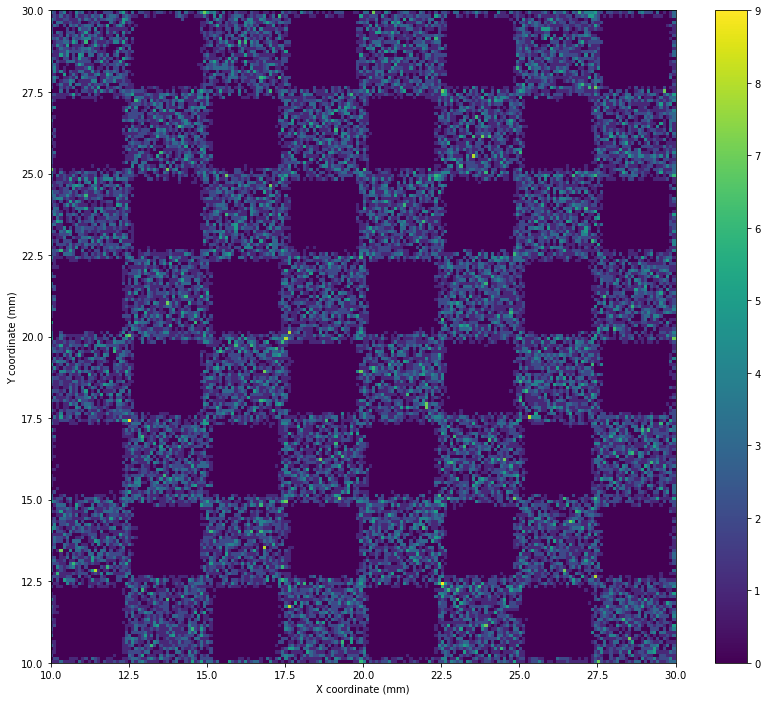

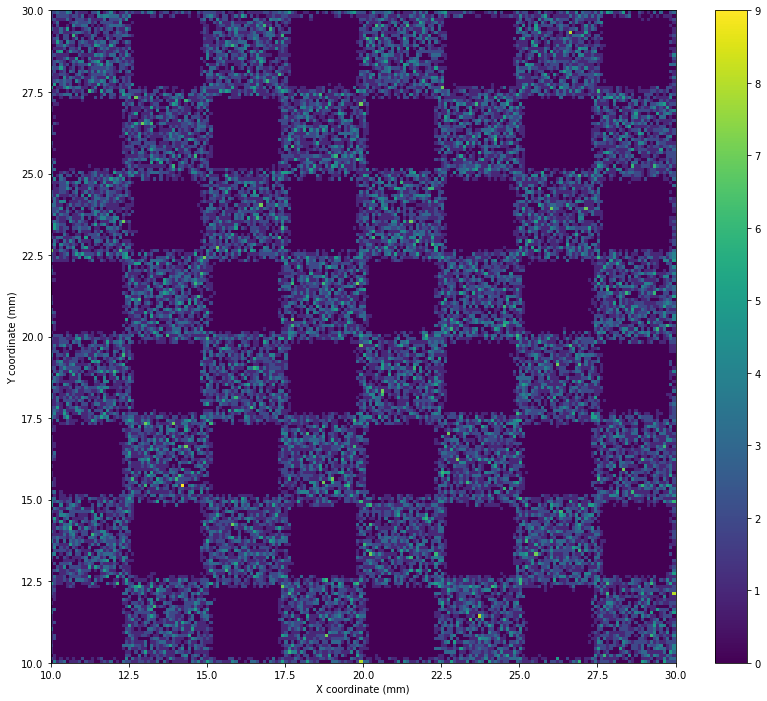

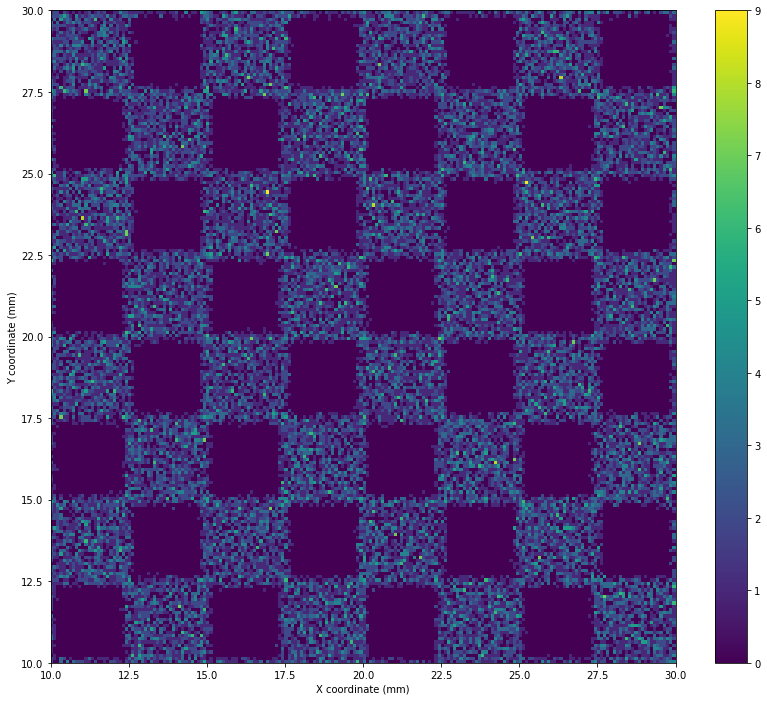

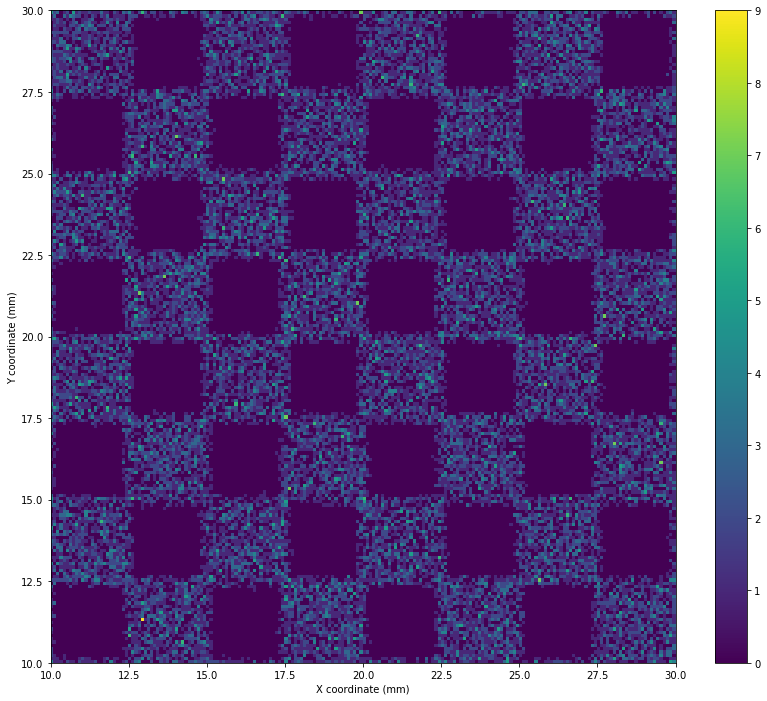

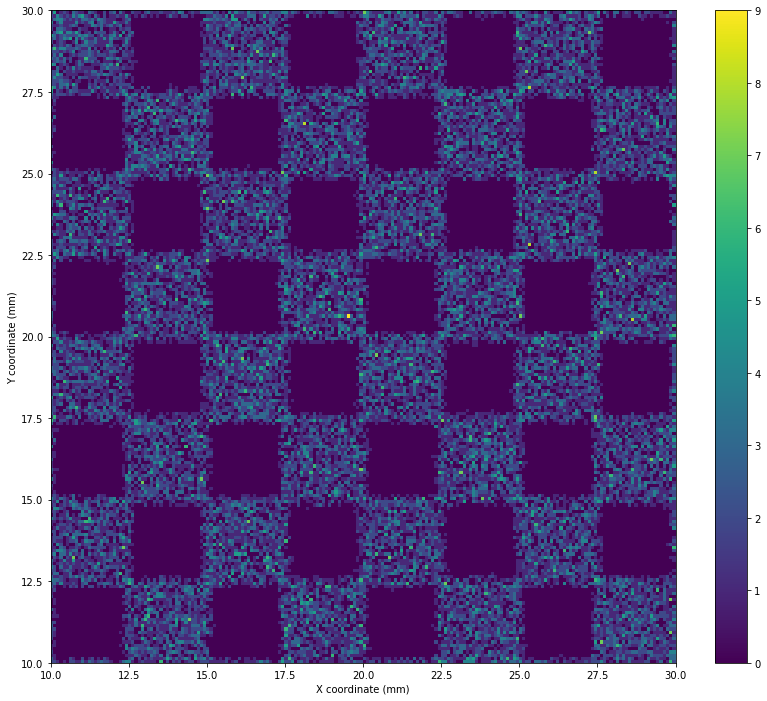

...

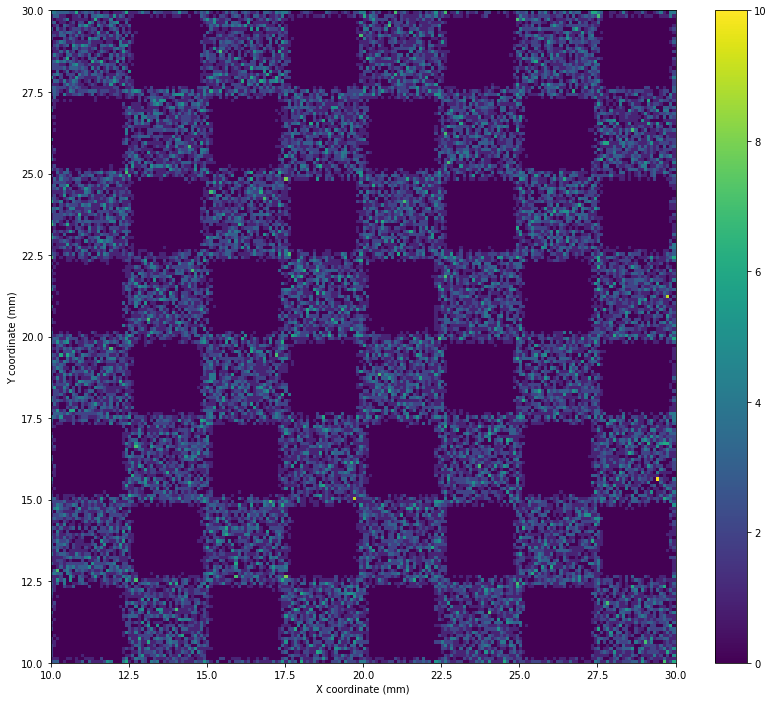

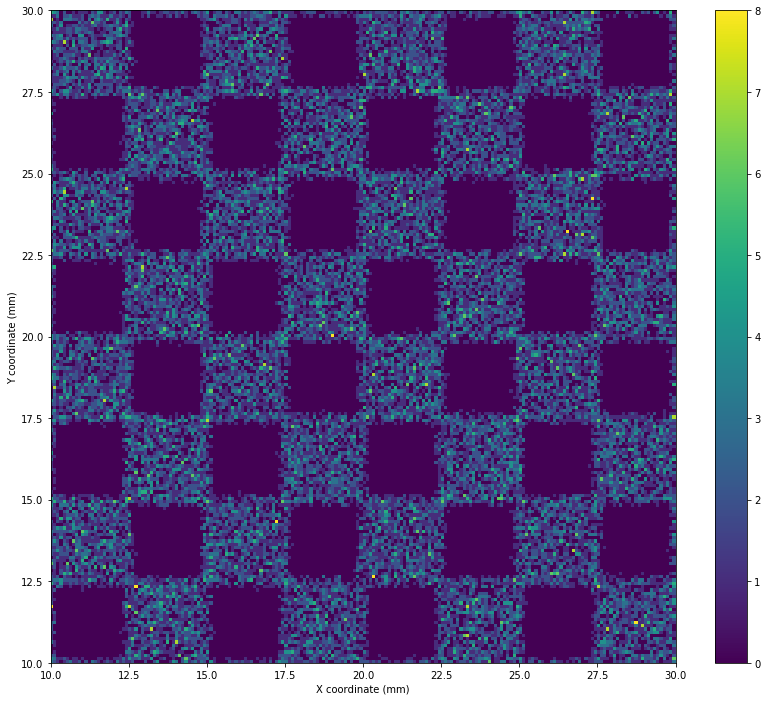

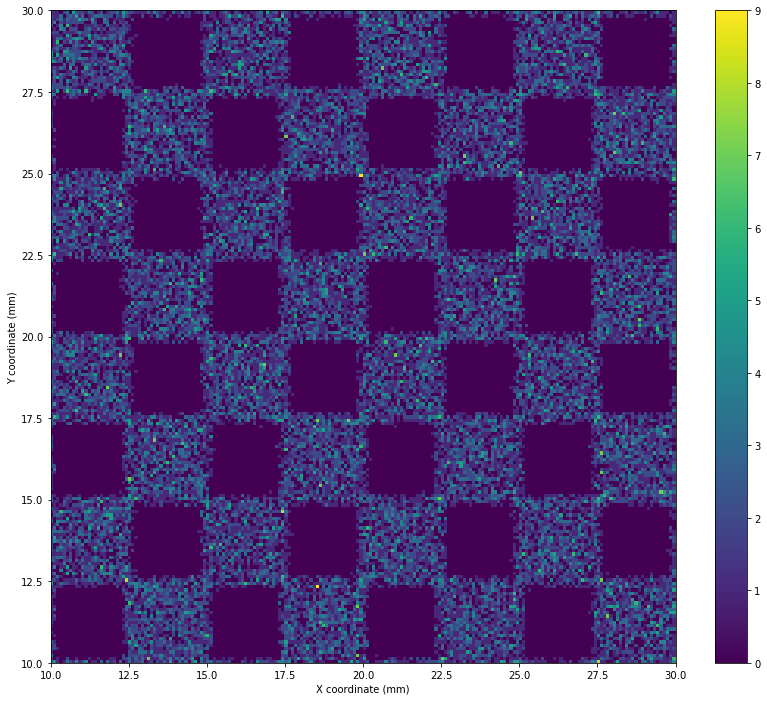

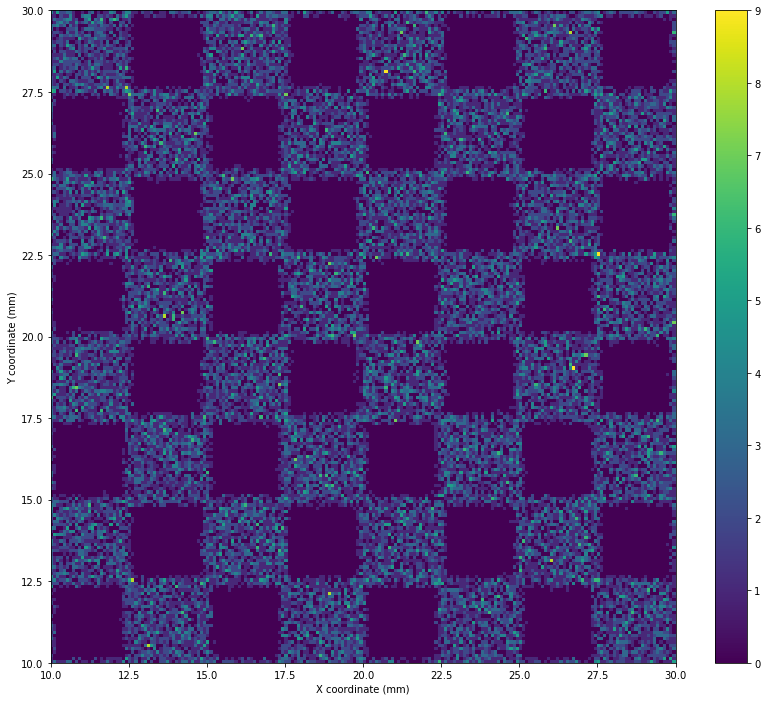

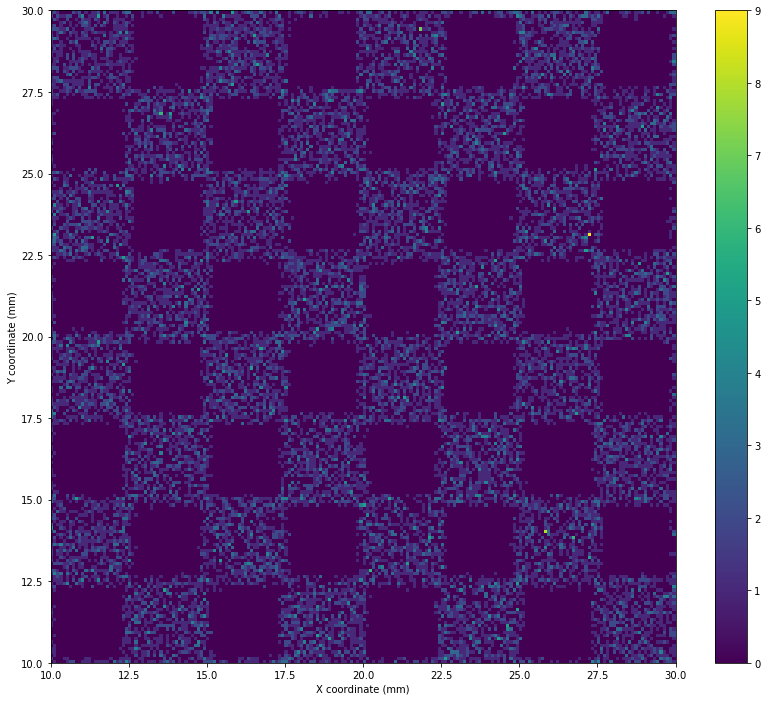

In [3]:
Foldername = "Test/"
IndexX = 90
IndexY = 118
finalhist = np.zeros(20)
bins = np.zeros(20)
overhist = set()
for foldernumber in range(9):
    Foldername = "Test"+str(foldernumber+1)+"/"
    folderrange = len(os.listdir(Foldername))
    for fileindex in range(int(folderrange/3)):
        print("New file")
        title = Foldername+"Testrun-of-full-sim-positionXY-index"+str(fileindex)+".txt"
        i,run = 0,0
        with open(title, 'r') as file:
            position = np.array(eval(file.read())) # read list string and convert to array
            file.close()
        hist,xax,yax = plot3D(position[:,0],position[:,1],fileindex,True,True)
        print("I'm here")
        title1 = "Hist-Geometry3D-batch-"+str(foldernumber+1)+"-item-"+str(fileindex)+".txt"
        title2 = "Xax-Geometry3D-batch-"+str(foldernumber+1)+"-item-"+str(fileindex)+".txt"
        title3 = "Yax-Geometry3D-batch-"+str(foldernumber+1)+"-item-"+str(fileindex)+".txt"
        f1 = open(title1,"a")
        f2 = open(title2,"a")
        f3 = open(title3,"a")
        for item in (hist):
            for elem in item:
                f1.write(str(elem))
                f1.write(",")
        f1.close()
        for item in (xax):
            f2.write(str(item))
            f2.write(",")
        f2.close()
        for item in (yax):
            f3.write(str(item))
            f3.write(",")
        f3.close()
        print("First files created on index "+str(fileindex)+", Folder "+str(foldernumber+1))
        hist,xax,yax,position,AngleX,AngleY = readplot3dFULL(title,fileindex,foldernumber+1)
        hist_resh = np.reshape(np.array(hist.tolist()).astype(np.float),[200,200])
        
        indices_X = [idx for idx,val in enumerate(position[:,0]) if xax[IndexX]< val <= xax[IndexX+1]]
        indices_Y = [idx for idx,val in enumerate(position[:,1]) if yax[IndexY]< val <= yax[IndexY+1]]
        print("Readfull successful, common indices ready")
        set_IndicesX = set(indices_X)
        set_IndicesY = set(indices_Y)
        common = []
        if set_IndicesX & set_IndicesY:
            common = set_IndicesX & set_IndicesY
        print(common)
        
        Distribution_X = np.zeros(len(common))
        Distribution_Y = np.zeros(len(common))
        set_X = set(Distribution_X)
        i = 0
        for elem in common:
            Distribution_X[i] = AngleX[elem]
            Distribution_Y[i] = AngleY[elem]
            i+=1
        print("Distribution X: ",Distribution_X)
        overhist.update(set_X)
        temphist,tempbins,patches = plt.hist(Distribution_X,bins=20,range=[-0.01,0.01])
        finalhist += temphist
        bins = tempbins
        print("Histogram "+str(fileindex)+" added")
        print("Current histogram: ",finalhist)
        print("Current binning: ",bins)
        print("Number of elements: ",np.sum(finalhist))
        print("\n","============================","\n")

13.0
index 53
{56195, 698246, 703111, 638279, 233323, 362029, 494513, 639090, 299187, 76404, 406167, 315258, 483035}
[-0.02317639  0.02718614  0.00268446 -0.01440043 -0.03143319  0.00312757
  0.00064166  0.01892266 -0.03051656  0.0190245  -0.00804424  0.03074922
  0.00374036]


(array([2., 0., 1., 0., 0., 1., 0., 1., 0., 0., 2., 2., 0., 0., 0., 0., 2.,
        0., 1., 1.]),
 array([-0.03143319, -0.02832407, -0.02521495, -0.02210583, -0.01899671,
        -0.01588759, -0.01277847, -0.00966935, -0.00656023, -0.00345111,
        -0.00034199,  0.00276713,  0.00587625,  0.00898537,  0.0120945 ,
         0.01520362,  0.01831274,  0.02142186,  0.02453098,  0.0276401 ,
         0.03074922]),
 <a list of 20 Patch objects>)

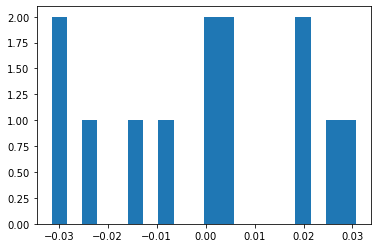

In [31]:
IndexX = 48
IndexY = 53

print(hist_resh[IndexX,IndexY])
print("index",np.argmax(hist_resh[48]))
#plt.plot(hist_resh[48,53])
indices_X = [idx for idx,val in enumerate(position[:,0]) if xax[IndexX]< val <= xax[IndexX+1]]
indices_Y = [idx for idx,val in enumerate(position[:,1]) if yax[IndexY]< val <= yax[IndexY+1]]

set_IndicesX = set(indices_X)
set_IndicesY = set(indices_Y)
common = []
if set_IndicesX & set_IndicesY:
    common = set_IndicesX & set_IndicesY
print(common)

Distribution_X = np.zeros(len(common))
Distribution_Y = np.zeros(len(common))
i = 0
for elem in common:
    Distribution_X[i] = AngleX[elem]
    Distribution_Y[i] = AngleY[elem]
    i+=1
print(Distribution_X)
plt.hist(Distribution_X,bins=20)
#plt.hist(Distribution_Y)

[-0.01  -0.009 -0.008 -0.007 -0.006 -0.005 -0.004 -0.003 -0.002 -0.001
  0.     0.001  0.002  0.003  0.004  0.005  0.006  0.007  0.008  0.009]
[ 0.  0.  0.  0.  0.  0. 24. 19. 27. 20. 20. 21. 29. 19. 24. 18.  9.  0.
  0.  0.]


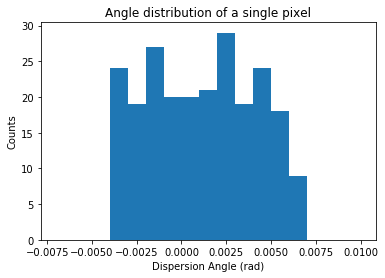

In [11]:
plt.bar(bins[3:20],finalhist[3:20],width=[0.001 for i in range(17)],align='edge')
plt.xlabel("Dispersion Angle (rad)")
plt.ylabel("Counts")
plt.title("Angle distribution of a single pixel")
print(bins[0:20])
print(finalhist)

<BarContainer object of 3 artists>

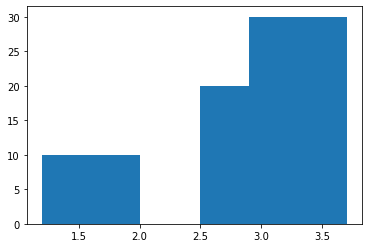

In [19]:
plt.bar([1.6, 2.9, 3.3], [10, 20, 30])